# BPI Challege 2019
## Business Information Systems
### Miad Alavinezhad
### Prof. Paolo Ceravolo
#### a.a. 2022 - 2023


### Description
#### The BPI Challenge 2019, the data is collected from a large multinational company operating from The Netherlands in the area of coatings and paints. We want to investigate the purchase order handling process for some of its 60 subsidiaries. In the data, each purchase order (or purchase document) contains one or more line items. For each line item, there are roughly four types of flows in the data:

#### - 3-way matching, invoice after goods receipt: For these items, the value of the goods receipt message should be matched against the value of an invoice receipt message and the value put during creation of the item.
#### - 3-way matching, invoice before goods receipt: For such purchase items, invoices can be entered before the goods are receipt, but they are blocked until goods are received.
#### - 2-way matching (no goods receipt needed): For these items, the value of the invoice should match the value at creation (in full or partially until PO value is consumed), but there is no separate goods receipt message required.
#### - Consignment: For these items, there are no invoices on PO (Purchase Order) level as this is handled fully in a separate process.


van Dongen, B.F., Dataset BPI Challenge 2019. 4TU.Centre for Research Data. 
https://doi.org/10.4121/uuid:d06aff4b-79f0-45e6-8ec8-e19730c248f1

### Importing data

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import pareto
import pm4py
import math
%matplotlib inline

In [3]:
df = pd.read_csv('BPI_Challenge_2019.csv', encoding="ISO-8859-1")

#### Attributes of the event log

In [4]:
df.columns

Index(['eventID ', 'case Spend area text', 'case Company',
       'case Document Type', 'case Sub spend area text',
       'case Purchasing Document', 'case Purch. Doc. Category name',
       'case Vendor', 'case Item Type', 'case Item Category',
       'case Spend classification text', 'case Source', 'case Name',
       'case GR-Based Inv. Verif.', 'case Item', 'case concept:name',
       'case Goods Receipt', 'event User', 'event org:resource',
       'event concept:name', 'event Cumulative net worth (EUR)',
       'event time:timestamp'],
      dtype='object')

In [5]:
df.rename(columns={'case concept:name': 'case:concept:name', 'event concept:name': 'concept:name', 'event time:timestamp': 'time:timestamp'}, inplace=True)

In [6]:
df.columns

Index(['eventID ', 'case Spend area text', 'case Company',
       'case Document Type', 'case Sub spend area text',
       'case Purchasing Document', 'case Purch. Doc. Category name',
       'case Vendor', 'case Item Type', 'case Item Category',
       'case Spend classification text', 'case Source', 'case Name',
       'case GR-Based Inv. Verif.', 'case Item', 'case:concept:name',
       'case Goods Receipt', 'event User', 'event org:resource',
       'concept:name', 'event Cumulative net worth (EUR)', 'time:timestamp'],
      dtype='object')

### Here we convert the pandas data frame to pm4py data frame by specifing which features are the case id, activity key and time stamp, in order to be able to further analyze the the data.
* case_id is a combination of PO(Purchase Order) ID and item ID as the case identifier.
* activity_key is The name of the activity that the events refer to.
* timestamp_key is activity completion time.

In [7]:
eventLog = pm4py.format_dataframe(df, case_id='case:concept:name', activity_key='concept:name', timestamp_key='time:timestamp')
eventLog

,eventID,case Spend area text,case Company,case Document Type,case Sub spend area text,case Purchasing Document,case Purch. Doc. Category name,case Vendor,case Item Type,case Item Category,...,case Item,case:concept:name,case Goods Receipt,event User,event org:resource,concept:name,event Cumulative net worth (EUR),time:timestamp,@@index,@@case_index
0,0,CAPEX & SOCS,companyID_0000,EC Purchase order,Facility Management,2000000000,Purchase order,vendorID_0000,Standard,"3-way match, invoice before GR",...,1,2000000000_00001,True,batch_00,batch_00,SRM: Created,298.0,2018-02-01 13:53:00+00:00,0,0
1,6,CAPEX & SOCS,companyID_0000,EC Purchase order,Facility Management,2000000000,Purchase order,vendorID_0000,Standard,"3-way match, invoice before GR",...,1,2000000000_00001,True,batch_00,batch_00,SRM: Change was Transmitted,298.0,2018-02-01 14:53:00+00:00,1,0
2,3,CAPEX & SOCS,companyID_0000,EC Purchase order,Facility Management,2000000000,Purchase order,vendorID_0000,Standard,"3-way match, invoice before GR",...,1,2000000000_00001,True,batch_00,batch_00,SRM: Document Completed,298.0,2018-02-01 14:53:00+00:00,2,0
3,2,CAPEX & SOCS,companyID_0000,EC Purchase order,Facility Management,2000000000,Purchase order,vendorID_0000,Standard,"3-way match, invoice before GR",...,1,2000000000_00001,True,batch_00,batch_00,SRM: Awaiting Approval,298.0,2018-02-01 14:53:00+00:00,3,0
4,1,CAPEX & SOCS,companyID_0000,EC Purchase order,Facility Management,2000000000,Purchase order,vendorID_0000,Standard,"3-way match, invoice before GR",...,1,2000000000_00001,True,batch_00,batch_00,SRM: Complete,298.0,2018-02-01 14:53:00+00:00,4,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1595918,1081176412389377,NaN,companyID_0003,Framework order,NaN,4508076348,Purchase order,vendorID_1974,Limit,2-way match,...,90,4508076348_00090,False,user_603,user_603,Change Approval for Purchase Order,1385.0,2019-01-17 15:00:00+00:00,1595918,251731
1595919,1081180707356672,NaN,companyID_0003,Framework order,NaN,4508076348,Purchase order,vendorID_1974,Limit,2-way match,...,100,4508076348_00100,False,user_602,user_602,Create Purchase Order Item,1385.0,2019-01-17 14:32:00+00:00,1595919,251732
1595920,1081180707356673,NaN,companyID_0003,Framework order,NaN,4508076348,Purchase order,vendorID_1974,Limit,2-way match,...,100,4508076348_00100,False,user_603,user_603,Change Approval for Purchase Order,1385.0,2019-01-17 15:00:00+00:00,1595920,251732
1595921,1081185002323968,NaN,companyID_0003,Framework order,NaN,4508076348,Purchase order,vendorID_1974,Limit,2-way match,...,110,4508076348_00110,False,user_602,user_602,Create Purchase Order Item,1385.0,2019-01-17 14:32:00+00:00,1595921,251733


## Statiscits
#### In this section, we can see the result of exploration and inspection of the data and the underlying processes. The data is recorded for the execution of Purchase-To-Pay processes of purchase orders submitted in 2018. The log contains 1,595,923 events and 251,734 cases. Each purchase order item is part of a purchase order (PO) document. Each PO document can consist of multiple items. There are 76,349 PO documents ('case Purchasing Document') in total.

In [8]:
num_events = len(eventLog)
num_cases = len(eventLog['case:concept:name'].unique())
num_PO = len(eventLog['case Purchasing Document'].unique())
print(f'Total Number of Events: \n > {num_events}')
print(f'Total Number of Cases: \n > {num_cases}')
print(f'Total Number of PO: \n > {num_PO}')

Total Number of Events: 
 > 1595923
Total Number of Cases: 
 > 251734
Total Number of PO: 
 > 76349


#### As mentioned in the description of the project we have four main flows in our event log which are 3-way match before, 3-way match after, 2-way match and consignment. Here the distribution of these flow are on the chart and the majority flow is 3-way match before.
#### - 3way Invoice before GR: Supplier sends their invoice to the buyer before the buyer receives the goods.
#### - 3way Invoice after GR: The buyer receives the goods first, verifies their quantity and condition, and then waits for the supplier's invoice before making the payment.
#### - 2way: Focuses on matching the items, quantities and prices associated with them in the sent invoice from the supplier.
#### - Consignment: This refers to goods that a seller (consignor) sends to a buyer (consignee), but ownership of the goods remains with the consignor until they are sold by the consignee.

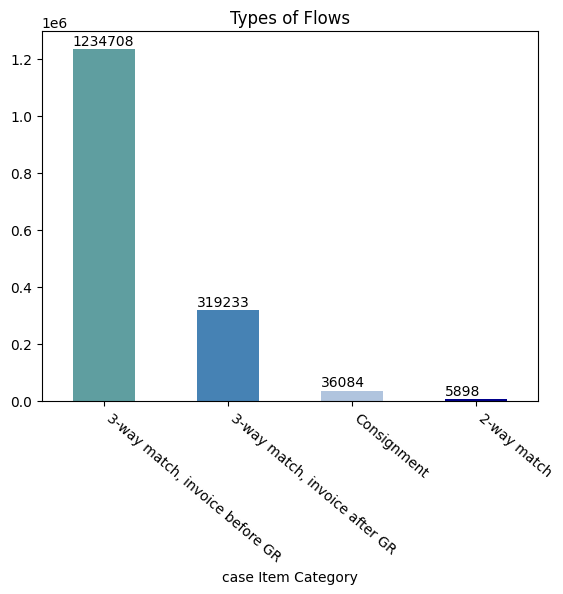

In [9]:
flows = eventLog['case Item Category'].value_counts()
flows = flows.plot.bar(color = ['#5F9EA0', '#4682B4', '#B0C4DE', '#00008B'])
for p in flows.patches:
    flows.annotate(str(p.get_height()), (p.get_x(), p.get_height() + 15000))
    
plt.title('Types of Flows')
plt.xticks(rotation=-40, ha='left')
plt.show()

### The distribution of the companies.
#### Almost all the involved companies are companies with companyID_0000 and companyID_0003

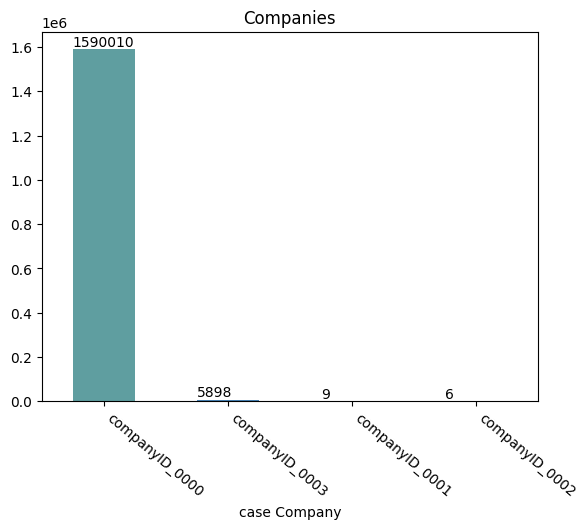

In [10]:
companies = eventLog['case Company'].value_counts().plot.bar(color = ['#5F9EA0', '#4682B4', '#B0C4DE', '#00008B'])
for c in companies.patches:
    companies.annotate(str(c.get_height()), (c.get_x(), c.get_height() + 15000))

plt.title('Companies')
plt.xticks(rotation=-40, ha='left')
plt.show()

### In the document types we have 3 different orders.

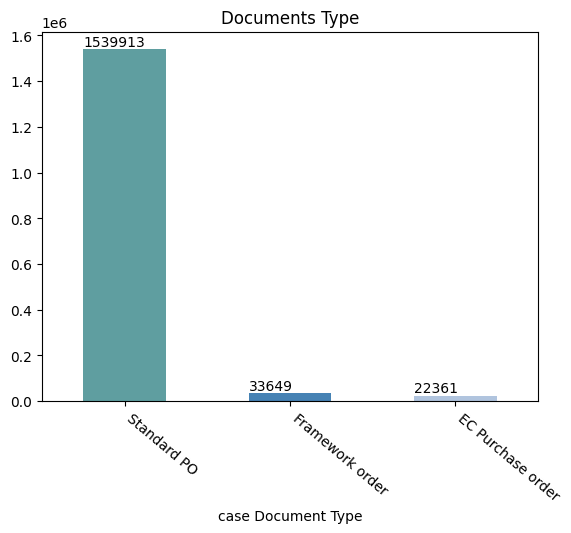

In [11]:
documents = eventLog['case Document Type'].value_counts().plot.bar(color = ['#5F9EA0', '#4682B4', '#B0C4DE'])
for d in documents.patches:
    documents.annotate(str(d.get_height()), (d.get_x(), d.get_height() + 15000))

plt.title('Documents Type')
plt.xticks(rotation=-40, ha='left')
plt.show()

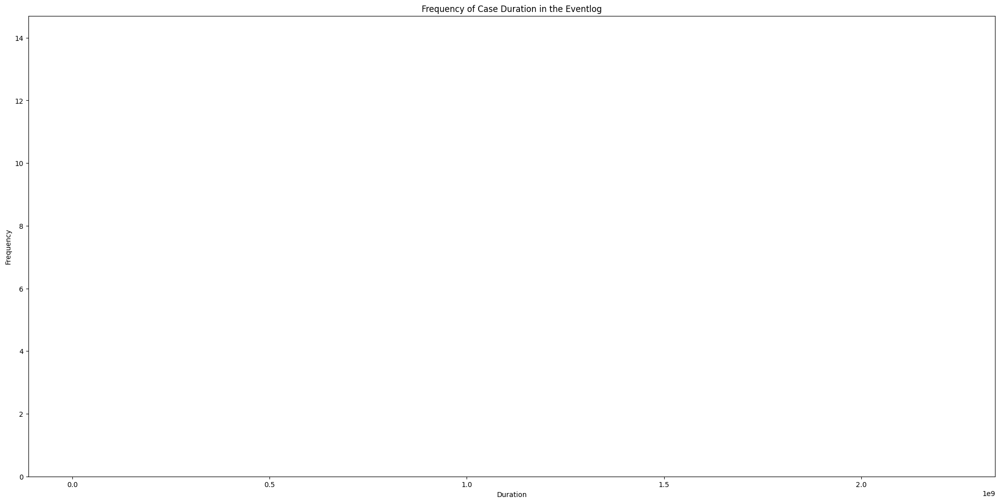

In [12]:
# Case Durations Plot
all_case_durations = pm4py.get_all_case_durations(eventLog)

duration_count = {}
for duration in all_case_durations:
    if duration in duration_count:
         duration_count[duration] += 1
    elif duration != 0:
        duration_count[duration] = 1

unique_durations = list(duration_count.keys())
durations_frequency = list(d // 60 for d in duration_count.values())

plt.figure(figsize=(25, 12))
plt.bar(unique_durations, durations_frequency, width=0.5)
plt.xlabel("Duration")
plt.ylabel("Frequency")
plt.title("Frequency of Case Duration in the Eventlog")
plt.show()

In [88]:
print(f' Numbers are in minutes:\n Minimun: {min(all_case_durations) // 60}, \
        Maximum: {max(all_case_durations) // 60} , \
        AVG: {sum(all_case_durations) // len(all_case_durations) // 60}')

 Numbers are in minutes:
 Minimun: 0.0,         Maximum: 37137009.0 ,         AVG: 246377.0


In [13]:
# Duration of cases
case_durations = eventLog.groupby('case:concept:name').agg(Events=('case:concept:name', 'count'),
start=('time:timestamp', lambda x: x.min()),
end=('time:timestamp', lambda x: x.max()),
duration=('time:timestamp', lambda x: x.max() - x.min()),)
case_durations

,Events,start,end,duration
case:concept:name,,,,
2000000000_00001,12,2018-02-01 13:53:00+00:00,2018-06-03 08:53:00+00:00,121 days 19:00:00
2000000001_00001,15,2018-01-16 13:09:00+00:00,2019-01-17 11:58:00+00:00,365 days 22:49:00
2000000002_00001,18,2018-04-01 14:17:00+00:00,2019-01-17 11:59:00+00:00,290 days 21:42:00
2000000003_00001,12,2018-08-01 07:21:00+00:00,2018-12-02 16:58:00+00:00,123 days 09:37:00
2000000003_00002,12,2018-08-01 07:21:00+00:00,2018-12-02 16:58:00+00:00,123 days 09:37:00
...,...,...,...,...
4508076348_00070,2,2019-01-17 14:32:00+00:00,2019-01-17 15:00:00+00:00,0 days 00:28:00
4508076348_00080,2,2019-01-17 14:32:00+00:00,2019-01-17 15:00:00+00:00,0 days 00:28:00
4508076348_00090,2,2019-01-17 14:32:00+00:00,2019-01-17 15:00:00+00:00,0 days 00:28:00


In [14]:
print('- Min Duration:', case_durations['duration'].min())
print('- Max Duration:', case_durations['duration'].max())
print('- Mean Duration:', case_durations['duration'].mean())

- Min Duration: 0 days 00:00:00
- Max Duration: 25789 days 14:09:00
- Mean Duration: 171 days 02:17:45.207719256


### Filter out events which have zero duration. The filter is in seconds. Events with time duration more than 1 second will pass the filter.

In [15]:
# Filter events with zero duration
filtered_log = pm4py.filter_case_performance(eventLog, 1, float('inf'))
print(f"- {len(eventLog['case:concept:name'].unique())} total cases in the log \n- {len(filtered_log['case:concept:name'].unique())} cases have duration more than zero")
print(f"- {len(eventLog['case:concept:name'].unique()) - len(filtered_log['case:concept:name'].unique())} cases were filtered")

- 251734 total cases in the log 
- 248149 cases have duration more than zero
- 3585 cases were filtered


## Variants

In [16]:
from pm4py.algo.filtering.log.variants import variants_filter
from pm4py.statistics.traces.generic.log import case_statistics

In [17]:
variants = variants_filter.get_variants(filtered_log)

In [18]:
variants_count = case_statistics.get_variant_statistics(filtered_log)
variants_count = sorted(variants_count, key=lambda x: x['count'], reverse=True)
print(f"- Number of Variants: {len(variants_count)}")

- Number of Variants: 24787


In [19]:
n = 10
print(f'The first {n} common Variants:', end=2*'\n')
for i, variant in enumerate(variants_count[:n]):
    print(i+1, end=' - ')
    for event in variant['variant']:
        print(event, '-> ', end='')
    print(variant['count'])
    print()

The first 10 common Variants:

1 - Create Purchase Order Item -> Vendor creates invoice -> Record Goods Receipt -> Record Invoice Receipt -> Clear Invoice -> 13607

2 - Create Purchase Order Item -> Record Goods Receipt -> 8558

3 - Create Purchase Order Item -> Record Goods Receipt -> Vendor creates invoice -> Record Invoice Receipt -> Clear Invoice -> 8384

4 - Create Purchase Order Item -> Delete Purchase Order Item -> 4651

5 - Record Goods Receipt -> Create Purchase Order Item -> 3544

6 - Create Purchase Order Item -> Vendor creates invoice -> Record Goods Receipt -> Clear Invoice -> Record Invoice Receipt -> 3539

7 - Create Purchase Order Item -> Receive Order Confirmation -> Record Goods Receipt -> Vendor creates invoice -> Record Invoice Receipt -> Clear Invoice -> 3327

8 - Clear Invoice -> Create Purchase Order Item -> Vendor creates invoice -> Record Goods Receipt -> Record Invoice Receipt -> 3050

9 - Create Purchase Requisition Item -> Create Purchase Order Item -> Recor

In [20]:
# Getting top k variants
top_log = pm4py.filter_variants_top_k(filtered_log, 3)
num_events = len(top_log)
num_cases = len(top_log['case:concept:name'].unique())
print("Number of events from top variants: {}\nNumber of cases from top variants: {}".format(num_events, num_cases))

Number of events from top variants: 127071
Number of cases from top variants: 30549


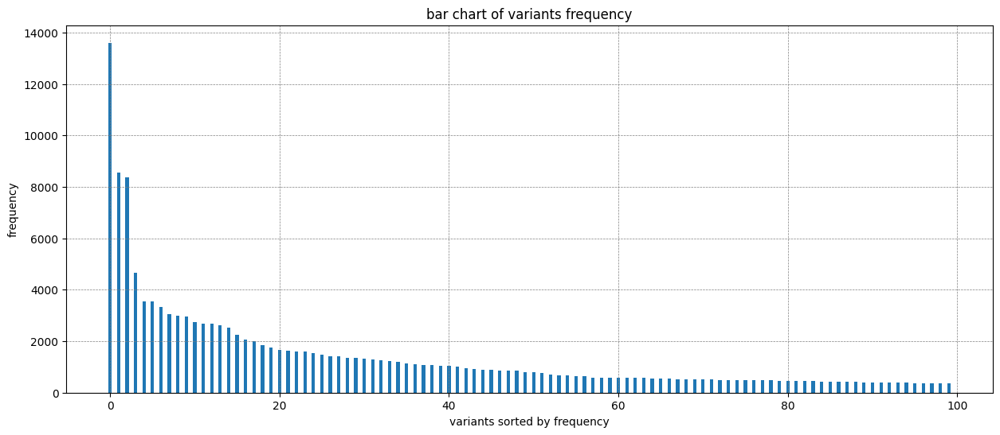

In [21]:
# frequency of first 100 variants
variants_df = pd.DataFrame.from_records(variants_count)
variant = variants_df[0:100].index
frequency = variants_df[0:100]['count']
# return a list of log values from a list 
frequency_log = [math.log(i, 2) for i in frequency] 

# Plot the histogram of the frequencies
fig = plt.figure(figsize = (15, 6))
 
# creating the bar plot
plt.bar(variant, frequency, width = 0.4)
 
plt.xlabel("variants sorted by frequency")
plt.ylabel("frequency")
plt.title("bar chart of variants frequency")
plt.grid(True, linestyle='--', color='gray', linewidth=0.5)
plt.show()

### Start and End Activities
#### Most frequnet start activity is 'Create Purchase Order Item' covering about 41% of all start activites. Since the event log is the records of purchase orders and its prcedures, it is expected that most of the cases start with creating a new purchase order form buyer. Next frequent start activities are 'Record Goods Receipt', 'Create Purchase Requisition Item', 'Record Invoice Receipt', 'Vendor creates invoice' and 'Clear invoice' which cover from about 14% down to 7% of all starts.

In [22]:
start_activities_variant_freq = pm4py.get_start_activities(filtered_log)
end_activities_variant_freq = pm4py.get_end_activities(filtered_log)
print("- Start activities ({}): {}\n\n- End activities ({}): {}".format(len(start_activities_variant_freq), start_activities_variant_freq, len(end_activities_variant_freq), end_activities_variant_freq))

- Start activities (31): {'SRM: Created': 819, 'Record Goods Receipt': 36068, 'Clear Invoice': 17905, 'Record Invoice Receipt': 24402, 'Record Service Entry Sheet': 1590, 'Vendor creates invoice': 23835, 'Vendor creates debit memo': 642, 'Cancel Invoice Receipt': 350, 'SRM: In Transfer to Execution Syst.': 2, 'SRM: Document Completed': 1, 'SRM: Awaiting Approval': 1, 'SRM: Change was Transmitted': 1, 'Create Purchase Order Item': 103698, 'Change Quantity': 2531, 'Block Purchase Order Item': 103, 'Change Delivery Indicator': 268, 'Remove Payment Block': 3235, 'Delete Purchase Order Item': 1142, 'Create Purchase Requisition Item': 27772, 'Change Approval for Purchase Order': 484, 'Change Price': 1447, 'Cancel Goods Receipt': 163, 'Receive Order Confirmation': 1505, 'Cancel Subsequent Invoice': 25, 'Change Storage Location': 36, 'Change Currency': 12, 'Update Order Confirmation': 29, 'Reactivate Purchase Order Item': 14, 'Release Purchase Order': 50, 'Record Subsequent Invoice': 12, 'Set 

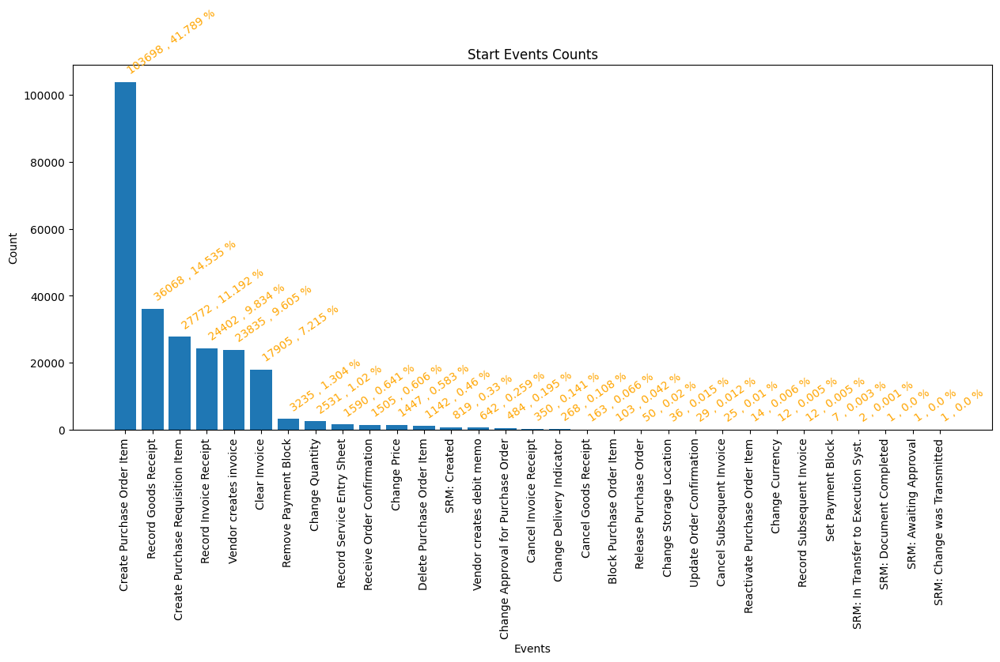

In [23]:
# Start Activity Plot
start_event = pm4py.get_start_activities(filtered_log)
sorted_start = sorted(start_event.items(), key=lambda x:x[1], reverse=True)

events, counts = [], []
for event in sorted_start:
    events.append(event[0])
    counts.append(event[1])

count_all_start_event = sum(counts)
percent = []
for e in sorted_start:
    percent.append(round(e[1] / count_all_start_event * 100, 3)) # Percent among only start events
    # percent.append(round(e[1] / len(eventLog) * 100, 3)) # Percent among all events
    

plt.figure(figsize=(15, 6))
plt.bar(events, counts)

for i, count in enumerate(counts):
    plt.text(i, count + 2500, f'{str(count)} , {str(percent[i])} %', color='orange', ha='left', rotation=35)
plt.title('Start Events Counts')
plt.xlabel('Events')
plt.xticks(rotation=90)
plt.ylabel('Count')
plt.show()

### End Activites
#### On end activities we have 'Clear invoice' on about 36% (most frequent). As the name suggests, clear invoice means that the related invoice has been completed(probably reviewed and the payment was done) which indicated the end for a process of purchasing an item. On next frequent end activites we have 'Record invoice receipt' and 'Record Goods Receipt'.
#### It seems odd that roughly 9% of end activites are 'Create Purchase Item' as it is most common event to start a case. This end activity can implies that the cases has only one event and both start and end activite is 'Create Purchase Item' which mean the PO has been placed but it did not continue.

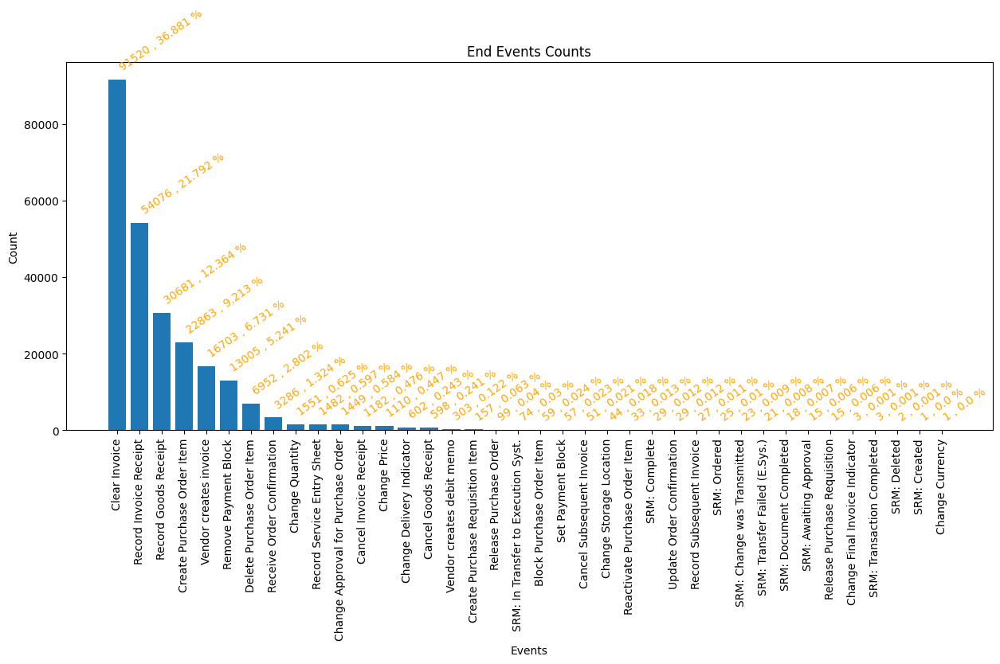

In [24]:
end_event = pm4py.get_end_activities(filtered_log)
sorted_end = sorted(end_event.items(), key=lambda x:x[1], reverse=True)

events, counts = [], []
for event in sorted_end:
    events.append(event[0])
    counts.append(event[1])

count_all_end_event = sum(counts)
percent = []
for e in sorted_end:
    percent.append(round(e[1] / count_all_end_event * 100, 3)) # Percent among only end events
    # percent.append(round(e[1] / len(eventLog) * 100, 3)) # Percent among all events
    
plt.figure(figsize=(15, 6))
plt.bar(events, counts)

for i, count in enumerate(counts):
    plt.text(i, count + 2500, f'{str(count)} , {str(percent[i])} %', color='orange', ha='left', rotation=35)
plt.title('End Events Counts')
plt.xlabel('Events')
plt.xticks(rotation=90)
plt.ylabel('Count')
plt.show()

### Event distributions through different time periods 

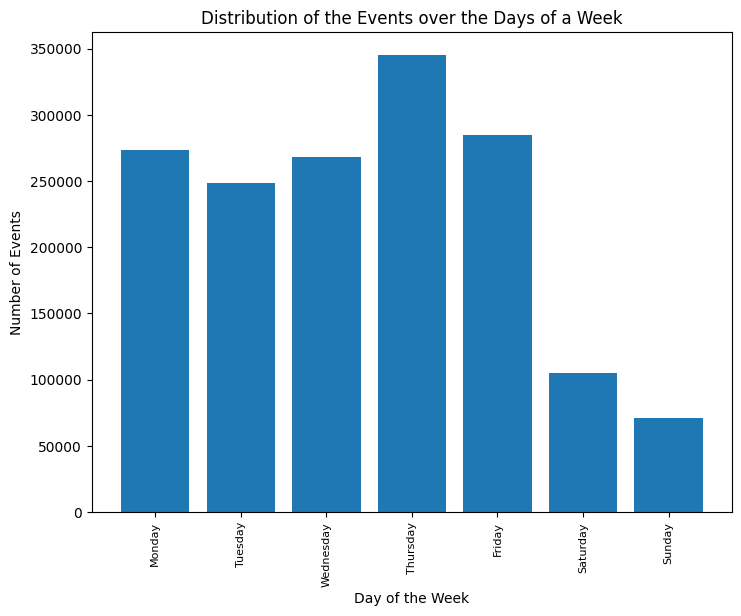

In [25]:
# Over days of the week
pm4py.view_events_distribution_graph(eventLog, distr_type="days_week", format="png")

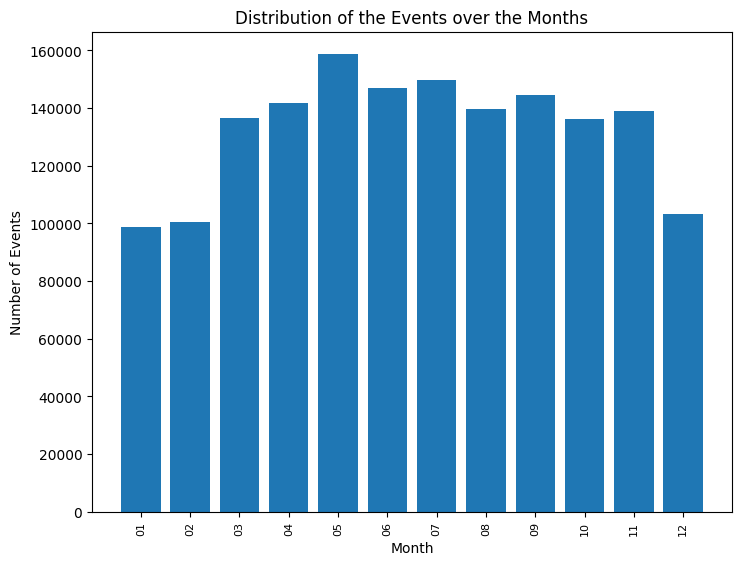

In [26]:
# Over months of the year
pm4py.view_events_distribution_graph(eventLog, distr_type="months", format="png")

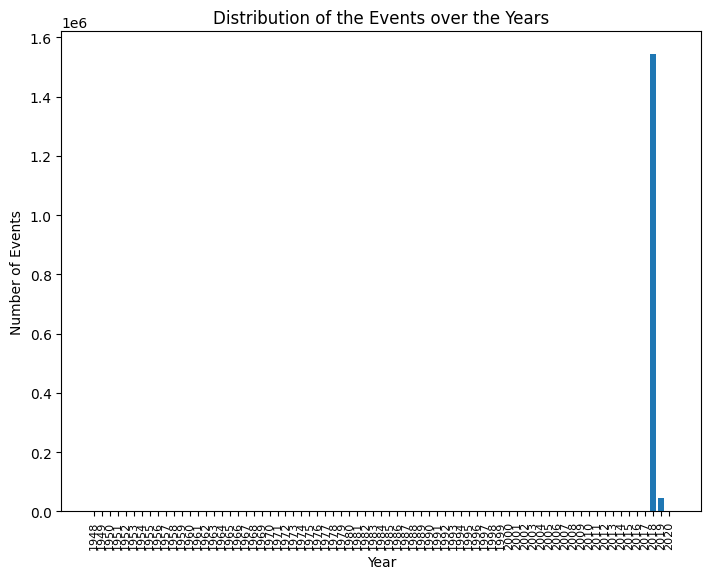

In [27]:
# distribution of events occuring over the years
pm4py.view_events_distribution_graph(filtered_log, distr_type="years")

### Filtering events based on year
#### 320 events filtered out as they don't occure in the scope that we are looking for. We chose 2018 as our scope since in description of the challenge it mentions that the events are for 2018, therefore events out of this scope may not be relevant. We also take into account events from 2019 as some events that started in 2018 may be finished in 2019.

In [28]:
# filter events from 2018 to end of 2019
filtered_time_event_log = pm4py.filter_time_range(filtered_log, "2018-01-1 00:00:00", "2020-01-1 00:00:00", mode='events')
activities_variant_freq = pm4py.get_event_attribute_values(filtered_time_event_log, "concept:name")

print('Number of unique events: ', len(activities_variant_freq))
print('- Events with their frequency:', activities_variant_freq)

Number of unique events:  42
- Events with their frequency: {'Record Goods Receipt': 312977, 'Create Purchase Order Item': 248149, 'Record Invoice Receipt': 228760, 'Vendor creates invoice': 219633, 'Clear Invoice': 194393, 'Record Service Entry Sheet': 162702, 'Remove Payment Block': 57136, 'Create Purchase Requisition Item': 46585, 'Receive Order Confirmation': 32065, 'Change Quantity': 21449, 'Change Price': 12423, 'Delete Purchase Order Item': 8819, 'Change Approval for Purchase Order': 7541, 'Cancel Invoice Receipt': 7096, 'Vendor creates debit memo': 6228, 'Change Delivery Indicator': 3288, 'Cancel Goods Receipt': 3096, 'SRM: In Transfer to Execution Syst.': 1765, 'SRM: Document Completed': 1628, 'SRM: Awaiting Approval': 1628, 'SRM: Ordered': 1628, 'SRM: Complete': 1628, 'SRM: Created': 1628, 'Release Purchase Order': 1610, 'SRM: Change was Transmitted': 1440, 'Reactivate Purchase Order Item': 543, 'Block Purchase Order Item': 514, 'Cancel Subsequent Invoice': 491, 'Release Purc

In [29]:
f'Number of events filtered: {len(filtered_log) - len(filtered_time_event_log)}'

'Number of events filtered: 320'

Num. of total events: 1588567
num. events in 2018: 1543460 , 97.2 %
num. events in 2019: 45107 , 2.8 %


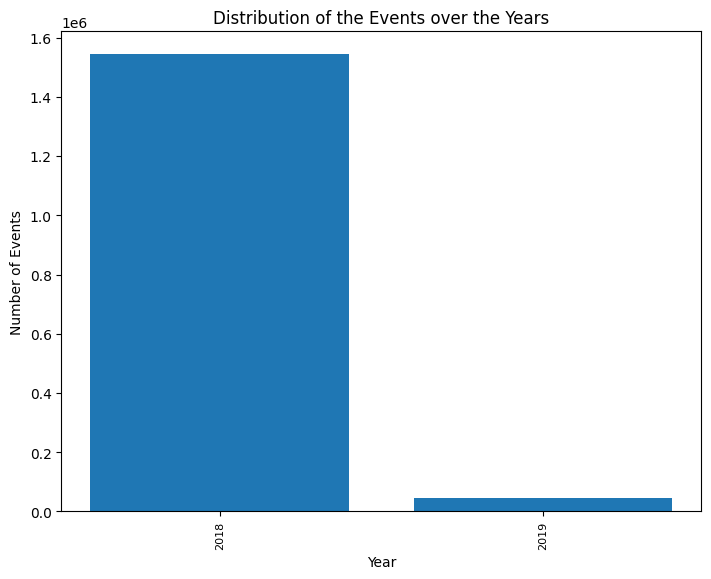

In [30]:
# distribution of events occuring over the years
event_log_2018 = pm4py.filter_time_range(filtered_log, "2018-01-1 00:00:00", "2019-01-1 00:00:00", mode='events')
event_log_2019 = pm4py.filter_time_range(filtered_log, "2019-01-1 00:00:00", "2020-01-1 00:00:00", mode='events')
total = len(filtered_time_event_log)

print('Num. of total events:', len(filtered_time_event_log))
print('num. events in 2018:', len(event_log_2018), ',',round(len(event_log_2018) / total * 100, 1), '%') # Percent out of all events
print('num. events in 2019:', len(event_log_2019), ',',round(len(event_log_2019) / total * 100, 1), '%')

pm4py.view_events_distribution_graph(filtered_time_event_log, distr_type="years")

## Different flows in the log (Item Category)
* 3-way matching, invoice before goods receipt *(before)*
* 3-way matching, invoice after goods receipt *(after)*
* 2-way matching (no goods receipt needed)
* Consignment

In [31]:
# events of 3-way before (2018-2019)
filter_3way_invoice_before_goods = filtered_time_event_log[filtered_time_event_log['case Item Category'] == '3-way match, invoice before GR']
print('Events with item category of 3-way match, invoice before goods receipt:', len(filter_3way_invoice_before_goods))
print(filter_3way_invoice_before_goods)

Events with item category of 3-way match, invoice before goods receipt: 1231918
                 eventID  case Spend area text    case Company  \
0                       0         CAPEX & SOCS  companyID_0000   
1                       6         CAPEX & SOCS  companyID_0000   
2                       3         CAPEX & SOCS  companyID_0000   
3                       2         CAPEX & SOCS  companyID_0000   
4                       1         CAPEX & SOCS  companyID_0000   
...                   ...                  ...             ...   
1593108  1076688171565058                Sales  companyID_0000   
1593109  1076692466532352                Sales  companyID_0000   
1593110  1076692466532355                Sales  companyID_0000   
1593111  1076692466532353                Sales  companyID_0000   
1593112  1076692466532354                Sales  companyID_0000   

        case Document Type case Sub spend area text  case Purchasing Document  \
0        EC Purchase order      Facility Manag

In [32]:
# events of 3-way after
filter_3way_invoice_after_goods = filtered_time_event_log[filtered_time_event_log['case Item Category'] == '3-way match, invoice after GR']
print('Events with item category of 3-way match, invoice after goods receipt:', filter_3way_invoice_after_goods.shape[0])
print(filter_3way_invoice_after_goods)

Events with item category of 3-way match, invoice after goods receipt: 314974
                 eventID  case Spend area text    case Company  \
12             4294967305            Marketing  companyID_0000   
13             4294967306            Marketing  companyID_0000   
14             4294967307            Marketing  companyID_0000   
15             4294967296            Marketing  companyID_0000   
16             4294967299            Marketing  companyID_0000   
...                   ...                  ...             ...   
1593173  1076701056467003            Logistics  companyID_0000   
1593174  1076701056467002            Logistics  companyID_0000   
1593175  1076701056466995            Logistics  companyID_0000   
1593176  1076701056466996            Logistics  companyID_0000   
1593177  1076701056467001            Logistics  companyID_0000   

        case Document Type    case Sub spend area text  \
12       EC Purchase order  Marketing Support Services   
13       EC P

In [33]:
# events of 2-way
filter_2way = filtered_time_event_log[filtered_time_event_log['case Item Category'] == '2-way match']
print('Events with item category of 2-way match:', filter_2way.shape[0])
print(filter_2way)

Events with item category of 2-way match: 5881
                 eventID  case Spend area text    case Company  \
929455   1076705351434241               Others  companyID_0003   
929456   1076705351434242               Others  companyID_0003   
929457   1076705351434243               Others  companyID_0003   
929458   1076705351434245               Others  companyID_0003   
929459   1076705351434246               Others  companyID_0003   
...                   ...                  ...             ...   
1595918  1081176412389377                  NaN  companyID_0003   
1595919  1081180707356672                  NaN  companyID_0003   
1595920  1081180707356673                  NaN  companyID_0003   
1595921  1081185002323968                  NaN  companyID_0003   
1595922  1081185002323969                  NaN  companyID_0003   

        case Document Type case Sub spend area text  case Purchasing Document  \
929455     Framework order                Utilities                4507075964  

In [34]:
# events of consignment
filter_consignment = filtered_time_event_log[filtered_time_event_log['case Item Category'] == 'Consignment']
print('Events with item category of consignment:', filter_consignment.shape[0])
print(filter_consignment)

Events with item category of consignment: 35794
                 eventID  case Spend area text    case Company  \
23253       2065879269376            Additives  companyID_0000   
23254       2065879269378            Additives  companyID_0000   
23255       2065879269377            Additives  companyID_0000   
23529       2272037699585            Packaging  companyID_0000   
23530       2272037699584            Packaging  companyID_0000   
...                   ...                  ...             ...   
1590140  1075120508502017     Specialty Resins  companyID_0000   
1590141  1075124803469312     Specialty Resins  companyID_0000   
1590142  1075124803469313     Specialty Resins  companyID_0000   
1590143  1075129098436608     Specialty Resins  companyID_0000   
1590144  1075129098436609     Specialty Resins  companyID_0000   

        case Document Type         case Sub spend area text  \
23253          Standard PO                        Extenders   
23254          Standard PO       

In [35]:
# Convert to event log
event_log_3way_before = pm4py.convert_to_event_log(filter_3way_invoice_before_goods)
event_log_3way_after = pm4py.convert_to_event_log(filter_3way_invoice_after_goods)
event_log_2way = pm4py.convert_to_event_log(filter_2way)
event_log_consignment = pm4py.convert_to_event_log(filter_consignment)

### Start and End activities for each main flow
#### In this section we get to see the most frequent start and end activites for each flow which allows us to gain more sight into these processes. By exctracting these activities we can understand how each flow may start and end in different senarios and later on which processes may be incomplete.

In [36]:
# 3-way before
start_activities_3way_before = pm4py.get_start_activities(event_log_3way_before)
end_activities_3way_before = pm4py.get_end_activities(event_log_3way_before)

most_frequent_startEvent = max(start_activities_3way_before.items(), key = lambda x: x[1])
most_frequent_endEvent = max(end_activities_3way_before.items(), key = lambda x : x[1])

print(f"Most frequent start event of 3-way before:\n{most_frequent_startEvent} \n\nMost frequent end event of 3-way before:\n{most_frequent_endEvent}")

Most frequent start event of 3-way before:
('Create Purchase Order Item', 90247) 

Most frequent end event of 3-way before:
('Clear Invoice', 86471)


In [37]:
# 3-way after
start_activities_3way_after = pm4py.get_start_activities(event_log_3way_after)
end_activities_3way_after = pm4py.get_end_activities(event_log_3way_after)

most_frequent_startEvent = max(start_activities_3way_after.items(), key = lambda x: x[1])
most_frequent_endEvent = max(end_activities_3way_after.items(), key = lambda x : x[1])

print(f"Most frequent start event of 3-way after:\n{most_frequent_startEvent} \n\nMost frequent end event of 3-way after:\n{most_frequent_endEvent}")

Most frequent start event of 3-way after:
('Create Purchase Order Item', 5396) 

Most frequent end event of 3-way after:
('Clear Invoice', 4929)


In [38]:
# 2-way
start_activities_2way = pm4py.get_start_activities(event_log_2way)
end_activities_2way = pm4py.get_end_activities(event_log_2way)

most_frequent_startEvent = max(start_activities_2way.items(), key = lambda x: x[1])
most_frequent_endEvent = max(end_activities_2way.items(), key = lambda x : x[1])

print(f"Most frequent start event of 2-way:\n{most_frequent_startEvent} \n\nMost frequent end event of 2-way:\n{most_frequent_endEvent}")

Most frequent start event of 2-way:
('Create Purchase Order Item', 399) 

Most frequent end event of 2-way:
('Change Approval for Purchase Order', 541)


In [39]:
# Consignment
start_activities_consignment = pm4py.get_start_activities(event_log_2way)
end_activities_consignment = pm4py.get_end_activities(event_log_2way)

most_frequent_startEvent = max(start_activities_2way.items(), key = lambda x: x[1])
most_frequent_endEvent = max(end_activities_2way.items(), key = lambda x : x[1])

print(f"Most frequent start event of 2-way:\n{most_frequent_startEvent} \n\nMost frequent end event of 2-way:\n{most_frequent_endEvent}")

Most frequent start event of 2-way:
('Create Purchase Order Item', 399) 

Most frequent end event of 2-way:
('Change Approval for Purchase Order', 541)


### Process discovery
#### Here we show for each flow their most frequent variants (which tells us what to expect in each process) and also show them using alpha miner, heuristic miner and petri net. 
#### Alpha Miner provides us with a Petri net model where all the transitions are visible and unique and correspond to classified events, an initial marking that describes the status of the Petri net model in the start of the execution and a final marking that describes the status of the Petri net model at the end of the execution.
#### Heuristics Miner acts on the Directly-Follows graphs, providing a way to find common constructs and relationships. It relies on analyzing the event log to discover causal relationships between activities. It examines how frequently activities appear together in specific sequences within different process instances. Its output is an object containing the activities and the relationships between them.

#### 3-way before

In [40]:
# 3-way before variants
variants_count = case_statistics.get_variant_statistics(event_log_3way_before)
n = 10
print(f'The first {n} common Variants:', end=2*'\n')
for i, variant in enumerate(variants_count[:n]):
    print(i+1, end=' - ')
    for event in variant['variant']:
        print(event, '-> ', end='')
    print(variant['count'])
    print()

The first 10 common Variants:

1 - Create Purchase Order Item -> Vendor creates invoice -> Record Goods Receipt -> Record Invoice Receipt -> Clear Invoice -> 12969

2 - Create Purchase Order Item -> Record Goods Receipt -> Vendor creates invoice -> Record Invoice Receipt -> Clear Invoice -> 7953

3 - Create Purchase Order Item -> Delete Purchase Order Item -> 4243

4 - Create Purchase Order Item -> Vendor creates invoice -> Record Goods Receipt -> Clear Invoice -> Record Invoice Receipt -> 3423

5 - Create Purchase Order Item -> Receive Order Confirmation -> Record Goods Receipt -> Vendor creates invoice -> Record Invoice Receipt -> Clear Invoice -> 3327

6 - Create Purchase Order Item -> Vendor creates invoice -> Record Invoice Receipt -> Record Goods Receipt -> Remove Payment Block -> Clear Invoice -> 2958

7 - Clear Invoice -> Create Purchase Order Item -> Vendor creates invoice -> Record Goods Receipt -> Record Invoice Receipt -> 2907

8 - Create Purchase Requisition Item -> Create

In [41]:
# Alpha miner and Petrinet visualizer 
from pm4py.algo.discovery.alpha import algorithm as alpha_miner
from pm4py.visualization.petri_net import visualizer as pn_visualizer
from pm4py.algo.discovery.heuristics import algorithm as heuristics_miner
from pm4py.visualization.heuristics_net import visualizer as hn_visualizer

replaying log with TBR, completed traces ::   0%|          | 0/18847 [00:00<?, ?it/s]

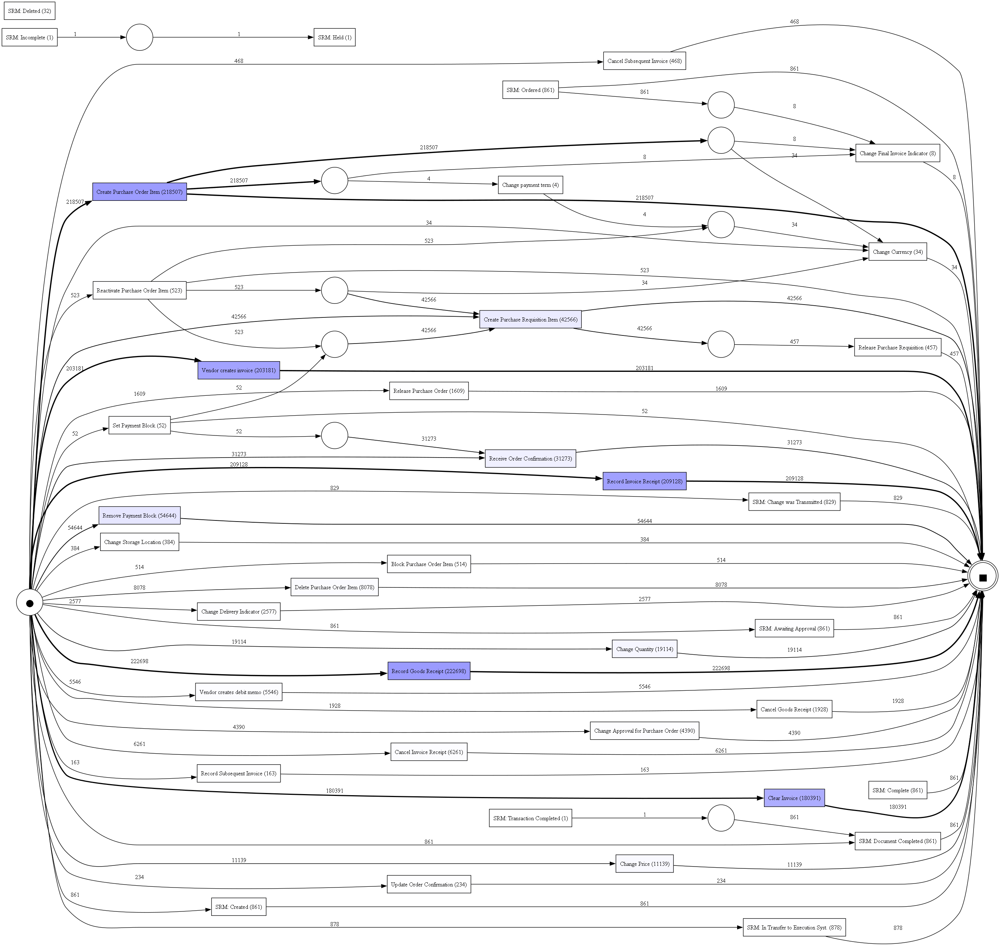

In [42]:
# 3-way-before
net, initial_marking, final_marking = alpha_miner.apply(event_log_3way_before)
parameters = {alpha_miner.Variants.ALPHA_VERSION_CLASSIC.value.Parameters.START_TIMESTAMP_KEY:'0:0:0'}
gviz = pn_visualizer.apply(net, initial_marking, final_marking, variant=pn_visualizer.Variants.FREQUENCY, parameters=parameters, log=event_log_3way_before)

pn_visualizer.view(gviz)

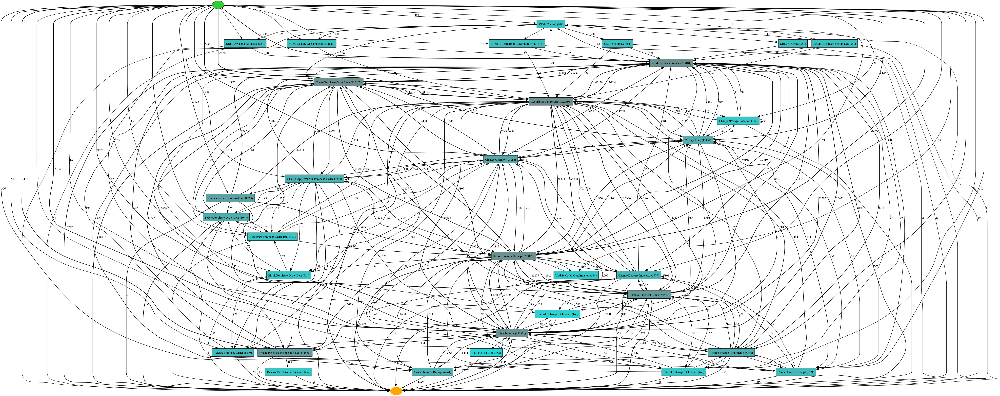

In [43]:
# 3-way before
heu_net_3way_before = pm4py.discover_heuristics_net(event_log_3way_before, dependency_threshold=0.95)
pm4py.view_heuristics_net(heu_net_3way_before)

#### 3-way after

In [44]:
# 3-way after variants
variants_count = case_statistics.get_variant_statistics(event_log_3way_after)
n = 10
print(f'The first {n} common Variants:', end=2*'\n')
for i, variant in enumerate(variants_count[:n]):
    print(i+1, end=' - ')
    for event in variant['variant']:
        print(event, '-> ', end='')
    print(variant['count'])
    print()

The first 10 common Variants:

1 - Create Purchase Order Item -> Vendor creates invoice -> Record Goods Receipt -> Record Invoice Receipt -> Clear Invoice -> 638

2 - Create Purchase Order Item -> Record Goods Receipt -> Vendor creates invoice -> Record Invoice Receipt -> Clear Invoice -> 431

3 - Create Purchase Order Item -> Record Goods Receipt -> 381

4 - Create Purchase Order Item -> Record Goods Receipt -> Record Invoice Receipt -> 250

5 - Create Purchase Order Item -> Delete Purchase Order Item -> 171

6 - Record Invoice Receipt -> Create Purchase Order Item -> Record Goods Receipt -> Vendor creates invoice -> Clear Invoice -> 156

7 - Record Goods Receipt -> Create Purchase Order Item -> Vendor creates invoice -> Record Invoice Receipt -> Clear Invoice -> 155

8 - Clear Invoice -> Create Purchase Order Item -> Vendor creates invoice -> Record Goods Receipt -> Record Invoice Receipt -> 143

9 - Create Purchase Order Item -> Record Goods Receipt -> Vendor creates invoice -> Reco

replaying log with TBR, completed traces ::   0%|          | 0/6311 [00:00<?, ?it/s]

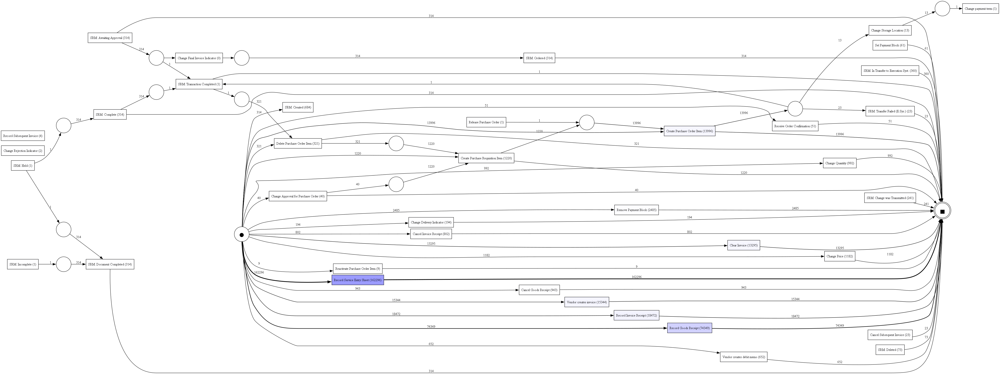

In [45]:
# 3way-after
net, initial_marking, final_marking = alpha_miner.apply(event_log_3way_after)
parameters = {alpha_miner.Variants.ALPHA_VERSION_CLASSIC.value.Parameters.START_TIMESTAMP_KEY:'0:0:0'}
gviz = pn_visualizer.apply(net, initial_marking, final_marking, variant=pn_visualizer.Variants.FREQUENCY, parameters=parameters, log=event_log_3way_after)
pn_visualizer.view(gviz)

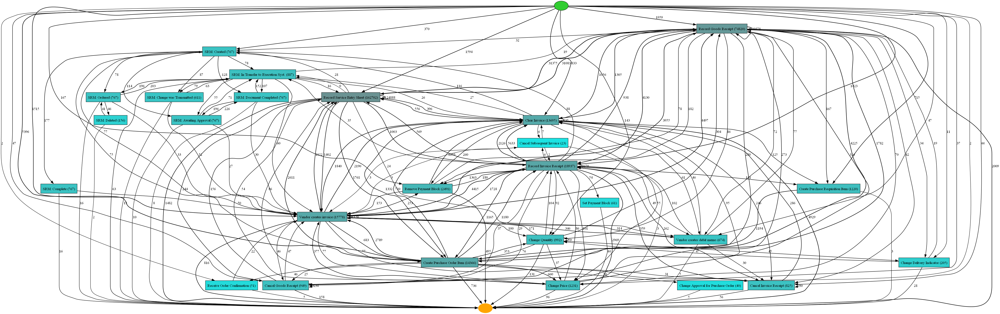

In [46]:
# 3-way after
heu_net_3way_after = pm4py.discover_heuristics_net(event_log_3way_after, dependency_threshold=0.95)
pm4py.view_heuristics_net(heu_net_3way_after)

#### 2-way

In [47]:
# 2-way variants
variants_count = case_statistics.get_variant_statistics(event_log_2way)
n = 10
print(f'The first {n} common Variants:', end=2*'\n')
for i, variant in enumerate(variants_count[:n]):
    print(i+1, end=' - ')
    for event in variant['variant']:
        print(event, '-> ', end='')
    print(variant['count'])
    print()

The first 10 common Variants:

1 - Create Purchase Order Item -> Change Approval for Purchase Order -> 226

2 - Vendor creates invoice -> Create Purchase Order Item -> Change Approval for Purchase Order -> Record Invoice Receipt -> 126

3 - Create Purchase Order Item -> Change Approval for Purchase Order -> Record Invoice Receipt -> Vendor creates invoice -> 73

4 - Change Approval for Purchase Order -> Create Purchase Order Item -> Change Approval for Purchase Order -> Change Approval for Purchase Order -> 52

5 - Vendor creates invoice -> Create Purchase Order Item -> Change Approval for Purchase Order -> Record Invoice Receipt -> Clear Invoice -> 50

6 - Change Approval for Purchase Order -> Change Approval for Purchase Order -> Create Purchase Order Item -> Change Approval for Purchase Order -> 49

7 - Create Purchase Order Item -> Change Approval for Purchase Order -> Vendor creates invoice -> Record Invoice Receipt -> 33

8 - Vendor creates invoice -> Create Purchase Order Item -

replaying log with TBR, completed traces ::   0%|          | 0/247 [00:00<?, ?it/s]

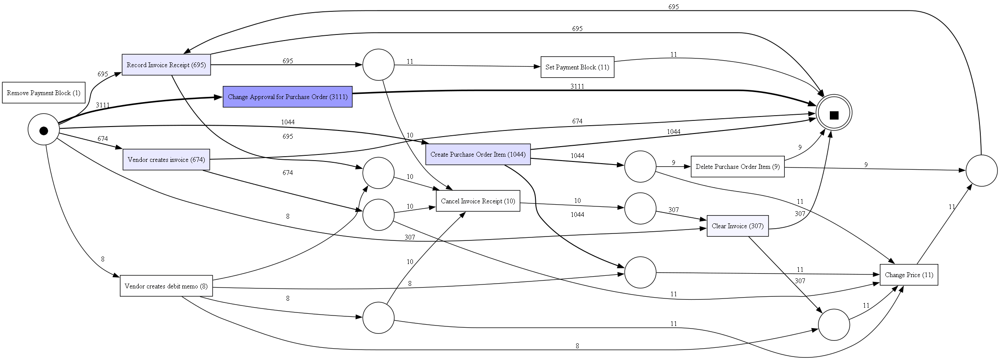

In [48]:
# 2-way
net, initial_marking, final_marking = alpha_miner.apply(event_log_2way)
parameters = {alpha_miner.Variants.ALPHA_VERSION_CLASSIC.value.Parameters.START_TIMESTAMP_KEY:'0:0:0'}
gviz = pn_visualizer.apply(net, initial_marking, final_marking, variant=pn_visualizer.Variants.FREQUENCY, parameters=parameters, log=event_log_2way)

pn_visualizer.view(gviz)

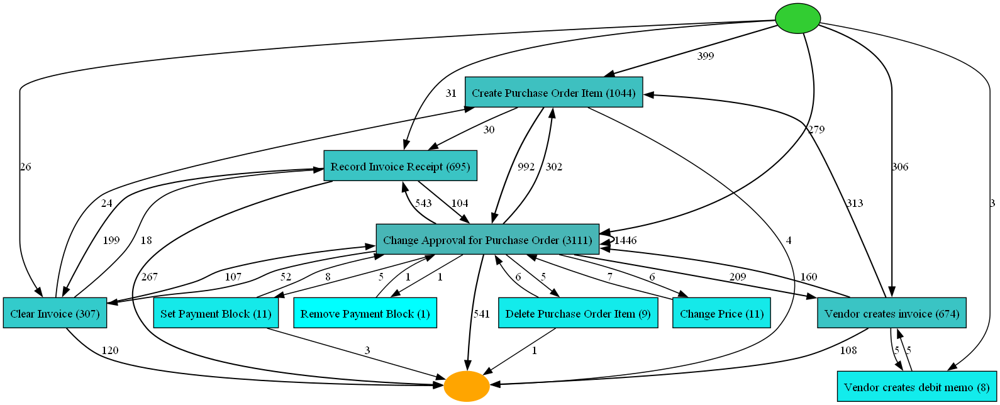

In [49]:
# 2-way
heu_net_2way = pm4py.discover_heuristics_net(event_log_2way, dependency_threshold=0.95)
pm4py.view_heuristics_net(heu_net_2way)

#### Consignment

In [51]:
# Consignment variants
variants_count = case_statistics.get_variant_statistics(event_log_consignment)
n = 10
print('Number of variants: ', len(event_log_consignment))
print(f'The first {n} common Variants:', end=2*'\n')
for i, variant in enumerate(variants_count[:n]):
    print(i+1, end=' - ')
    for event in variant['variant']:
        print(event, '-> ', end='')
    print(variant['count'])
    print()

Number of variants:  14232
The first 10 common Variants:

1 - Create Purchase Order Item -> Record Goods Receipt -> 5941

2 - Record Goods Receipt -> Create Purchase Order Item -> 2835

3 - Create Purchase Requisition Item -> Create Purchase Order Item -> Record Goods Receipt -> 1259

4 - Record Goods Receipt -> Create Purchase Requisition Item -> Create Purchase Order Item -> 407

5 - Create Purchase Order Item -> Record Goods Receipt -> Record Goods Receipt -> 339

6 - Create Purchase Order Item -> Change Quantity -> Record Goods Receipt -> 263

7 - Create Purchase Requisition Item -> Create Purchase Order Item -> 253

8 - Create Purchase Order Item -> Receive Order Confirmation -> Record Goods Receipt -> 250

9 - Create Purchase Order Item -> Delete Purchase Order Item -> 238

10 - Record Goods Receipt -> Create Purchase Order Item -> Receive Order Confirmation -> 108



replaying log with TBR, completed traces ::   0%|          | 0/501 [00:00<?, ?it/s]

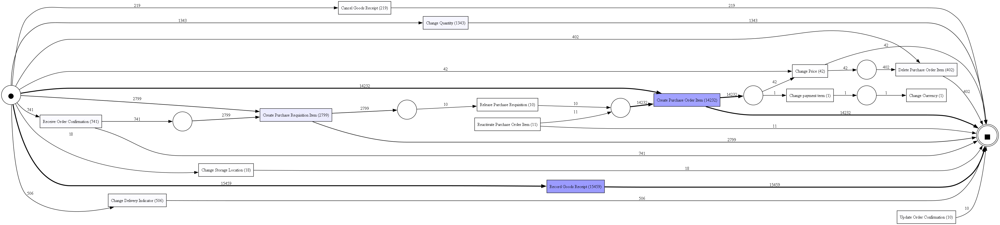

In [52]:
# consignment
net, initial_marking, final_marking = alpha_miner.apply(event_log_consignment)
parameters = {alpha_miner.Variants.ALPHA_VERSION_CLASSIC.value.Parameters.START_TIMESTAMP_KEY:'0:0:0'}
gviz = pn_visualizer.apply(net, initial_marking, final_marking, variant=pn_visualizer.Variants.FREQUENCY, parameters=parameters, log=event_log_consignment)

pn_visualizer.view(gviz)

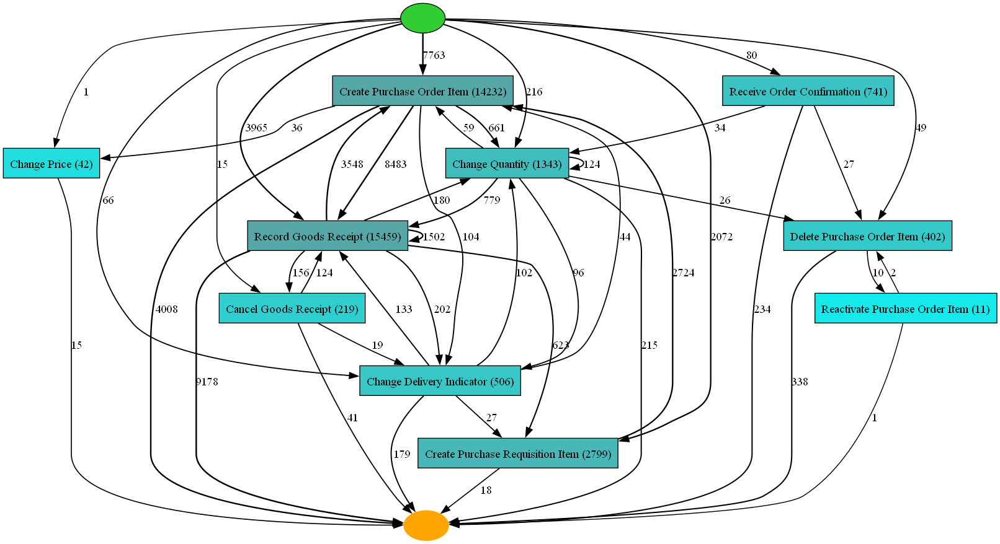

In [53]:
# Consignment
heu_net_consignment = pm4py.discover_heuristics_net(event_log_consignment, dependency_threshold=0.95)
pm4py.view_heuristics_net(heu_net_consignment)

### Conformance checking
#### This section is devoted to conformance checking which is a techniques to compare a process model with an event log of the same process. The goal is to check if the event log conforms to the model and, vice versa. It tells us how well the actual execution of a business process aligns with the expected or desired behavior.

In [54]:
from pm4py.algo.evaluation.replay_fitness import algorithm as replay_fitness_evaluator

#### 3-way before

In [55]:
# Conformance checking for 3-way before
net, initial_marking, final_marking = pm4py.discover_petri_net_alpha(event_log_3way_before)
replayed_traces = pm4py.conformance_diagnostics_token_based_replay(event_log_3way_before, net, initial_marking, final_marking)

replaying log with TBR, completed traces ::   0%|          | 0/18847 [00:00<?, ?it/s]

In [56]:
# Average of trace fitness
print('Average Trace Fitness:', sum([x['trace_fitness'] for x in replayed_traces]) / len(replayed_traces))

Average Trace Fitness: 0.27001288489727454


In [57]:
fitness = replay_fitness_evaluator.apply(event_log_3way_before, net, initial_marking, final_marking, variant=replay_fitness_evaluator.Variants.TOKEN_BASED)
print(fitness)

replaying log with TBR, completed traces ::   0%|          | 0/18847 [00:00<?, ?it/s]

{'perc_fit_traces': 0.0, 'average_trace_fitness': 0.27001288489727454, 'log_fitness': 0.25290221906367183, 'percentage_of_fitting_traces': 0.0}


In [58]:
trace_lst = []
for trace in replayed_traces:
    trace_lst.append({'is_fit':trace['trace_is_fit'], 'consumed_tokens':trace['consumed_tokens'], 'remaining_tokens':trace['remaining_tokens']})
trace_df = pd.DataFrame(trace_lst)
trace_df

,is_fit,consumed_tokens,remaining_tokens
0,False,12,14
1,False,12,14
2,False,12,14
3,False,12,14
4,False,12,14
...,...,...,...
218502,False,8,7
218503,False,8,7
218504,False,5,5
218505,False,5,5


#### 3-way after

In [89]:
# Conformance checking for 3-way after
net, initial_marking, final_marking = pm4py.discover_petri_net_alpha(event_log_3way_after)
replayed_traces = pm4py.conformance_diagnostics_token_based_replay(event_log_3way_after, net, initial_marking, final_marking)

replaying log with TBR, completed traces ::   0%|          | 0/6311 [00:00<?, ?it/s]

In [60]:
# Average of trace fitness
print('Average Trace Fitness:', sum([x['trace_fitness'] for x in replayed_traces]) / len(replayed_traces))

Average Trace Fitness: 0.22946234023422193


In [61]:
fitness = replay_fitness_evaluator.apply(event_log_3way_after, net, initial_marking, final_marking, variant=replay_fitness_evaluator.Variants.TOKEN_BASED)
print(fitness)

replaying log with TBR, completed traces ::   0%|          | 0/6311 [00:00<?, ?it/s]

{'perc_fit_traces': 0.0, 'average_trace_fitness': 0.22946234023422193, 'log_fitness': 0.08701789631505458, 'percentage_of_fitting_traces': 0.0}


In [62]:
trace_lst = []
for trace in replayed_traces:
    trace_lst.append({'is_fit':trace['trace_is_fit'], 'consumed_tokens':trace['consumed_tokens'], 'remaining_tokens':trace['remaining_tokens']})
trace_df = pd.DataFrame(trace_lst)
trace_df

,is_fit,consumed_tokens,remaining_tokens
0,False,14,15
1,False,17,18
2,False,8,9
3,False,14,16
4,False,13,14
...,...,...,...
14361,False,155,153
14362,False,7,3
14363,False,7,3
14364,False,10,6


#### 2-way

In [90]:
# Conformance checking for 2-way
net, initial_marking, final_marking = pm4py.discover_petri_net_alpha(event_log_2way)
replayed_traces = pm4py.conformance_diagnostics_token_based_replay(event_log_2way, net, initial_marking, final_marking)


replaying log with TBR, completed traces ::   0%|          | 0/247 [00:00<?, ?it/s]

In [64]:
# Average of trace fitness
print('Average Trace Fitness:', sum([x['trace_fitness'] for x in replayed_traces]) / len(replayed_traces))

Average Trace Fitness: 0.29475998959442706


In [65]:
fitness = replay_fitness_evaluator.apply(event_log_2way, net, initial_marking, final_marking, variant=replay_fitness_evaluator.Variants.TOKEN_BASED)
print(fitness)

replaying log with TBR, completed traces ::   0%|          | 0/247 [00:00<?, ?it/s]

{'perc_fit_traces': 0.0, 'average_trace_fitness': 0.29475998959442706, 'log_fitness': 0.23215522074281714, 'percentage_of_fitting_traces': 0.0}


In [66]:
trace_lst = []
for trace in replayed_traces:
    trace_lst.append({'is_fit':trace['trace_is_fit'], 'consumed_tokens':trace['consumed_tokens'], 'remaining_tokens':trace['remaining_tokens']})
trace_df = pd.DataFrame(trace_lst)
trace_df

,is_fit,consumed_tokens,remaining_tokens
0,False,9,10
1,False,10,12
2,False,15,11
3,False,15,11
4,False,3,3
...,...,...,...
1039,False,3,3
1040,False,3,3
1041,False,3,3
1042,False,3,3


#### Consignment

In [91]:
# Conformance checking for Consignment
net, initial_marking, final_marking = pm4py.discover_petri_net_alpha(event_log_consignment)
replayed_traces = pm4py.conformance_diagnostics_token_based_replay(event_log_consignment, net, initial_marking, final_marking)

replaying log with TBR, completed traces ::   0%|          | 0/501 [00:00<?, ?it/s]

In [68]:
# Average of trace fitness
print('Average Trace Fitness:', sum([x['trace_fitness'] for x in replayed_traces]) / len(replayed_traces))

Average Trace Fitness: 0.44150240859900836


In [69]:
fitness = replay_fitness_evaluator.apply(event_log_consignment, net, initial_marking, final_marking, variant=replay_fitness_evaluator.Variants.TOKEN_BASED)
print(fitness)

replaying log with TBR, completed traces ::   0%|          | 0/501 [00:00<?, ?it/s]

{'perc_fit_traces': 0.0, 'average_trace_fitness': 0.44150240859900836, 'log_fitness': 0.4218312770638884, 'percentage_of_fitting_traces': 0.0}


In [70]:
trace_lst = []
for trace in replayed_traces:
    trace_lst.append({'is_fit':trace['trace_is_fit'], 'consumed_tokens':trace['consumed_tokens'], 'remaining_tokens':trace['remaining_tokens']})
trace_df = pd.DataFrame(trace_lst)
trace_df

,is_fit,consumed_tokens,remaining_tokens
0,False,5,3
1,False,4,2
2,False,4,2
3,False,4,2
4,False,4,2
...,...,...,...
14227,False,4,2
14228,False,4,2
14229,False,4,2
14230,False,4,2
